<a href="https://colab.research.google.com/github/nandanak77/coco_care/blob/main/segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.2/949.2 kB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 69.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 64.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 46.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 36.7 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstall

In [ ]:
import os
import cv2
import json
from ultralytics import YOLO

# Paths
model_path = "/content/drive/MyDrive/coconutdisease_yolov8_results/yolov8_coconut_training4/weights/best.pt"
source_dataset_path = "/content/drive/MyDrive/CoconutDisease.v1i.yolov8"
destination_dataset_path = "/content/drive/MyDrive/CoconutDisease_Detected4_COCO"
os.makedirs(destination_dataset_path, exist_ok=True)

# Load YOLOv8 model
model = YOLO(model_path)

# Define categories
categories = [
    {"id": 0, "name": "bud root drooping"},
    {"id": 1, "name": "bud rot"},
    {"id": 2, "name": "gray leaf"},
    {"id": 3, "name": "leaf rot"},
    {"id": 4, "name": "stem bleeding"}
]

# Track skipped images
skipped_images = []

# Process each dataset split
for split in ['train', 'valid', 'test']:
    img_dir = os.path.join(source_dataset_path, split, 'images')
    save_dir = os.path.join(destination_dataset_path, split, 'images')
    os.makedirs(save_dir, exist_ok=True)

    coco_data = {
        "images": [],
        "annotations": [],
        "categories": categories
    }

    image_id = 0
    annotation_id = 0

    # Process images in the split
    for img_file in os.listdir(img_dir):
        if img_file.endswith(('.jpg', '.png')):
            img_path = os.path.join(img_dir, img_file)
            save_path = os.path.join(save_dir, img_file)

            # Read image
            image = cv2.imread(img_path)
            if image is None:
                print(f"❌ Failed to load image: {img_path}")
                skipped_images.append(img_path)
                continue

            try:
                height, width, _ = image.shape
            except Exception as e:
                print(f"⚠️ Error getting image dimensions: {img_file} - {e}")
                skipped_images.append(img_path)
                continue

            # Detect objects
            results = model.predict(img_path)

            # Save original image
            cv2.imwrite(save_path, image)

            # Add image info to COCO JSON
            coco_data["images"].append({
                "id": image_id,
                "file_name": img_file,
                "width": width,
                "height": height
            })

            # Process detection results
            for result in results:
                for box in result.boxes.data:
                    x1, y1, x2, y2, score, class_id = box.tolist()
                    if score > 0.5:  # Confidence threshold
                        coco_data["annotations"].append({
                            "id": annotation_id,
                            "image_id": image_id,
                            "category_id": int(class_id),
                            "bbox": [x1, y1, x2 - x1, y2 - y1],
                            "area": (x2 - x1) * (y2 - y1),
                            "score": float(score),
                            "iscrowd": 0
                        })
                        annotation_id += 1

            image_id += 1

    # Save COCO JSON file inside the images folder for each split
    coco_json_path = os.path.join(destination_dataset_path, split, 'images', '_annotations.coco.json')
    with open(coco_json_path, 'w') as json_file:
        json.dump(coco_data, json_file, indent=4)

# Save skipped images to a log file
skipped_log_path = os.path.join(destination_dataset_path, 'skipped_images.log')
with open(skipped_log_path, 'w') as log_file:
    for skipped_img in skipped_images:
        log_file.write(skipped_img + "\n")

print("✅ New dataset with detections in COCO format is ready!")
if skipped_images:
    print(f"⚠️ Skipped {len(skipped_images)} images. Check skipped_images.log for details.")

Streaming output truncated to the last 5000 lines.

image 1/1 /content/drive/MyDrive/CoconutDisease.v1i.yolov8/train/images/LeafRot307_jpg.rf.c82e32088e62aed043954c9fe13bee19.jpg: 800x800 4 leaf rots, 10.1ms
Speed: 8.2ms preprocess, 10.1ms inference, 1.2ms postprocess per image at shape (1, 3, 800, 800)

image 1/1 /content/drive/MyDrive/CoconutDisease.v1i.yolov8/train/images/LeafRot307_jpg.rf.d7d704913285c4896f3d48650224acb7.jpg: 800x800 4 leaf rots, 10.0ms
Speed: 7.7ms preprocess, 10.0ms inference, 1.2ms postprocess per image at shape (1, 3, 800, 800)

image 1/1 /content/drive/MyDrive/CoconutDisease.v1i.yolov8/train/images/LeafRot308_jpg.rf.1693ce2c394eaef467e5635e2d889f23.jpg: 800x800 4 leaf rots, 10.1ms
Speed: 6.6ms preprocess, 10.1ms inference, 1.2ms postprocess per image at shape (1, 3, 800, 800)

image 1/1 /content/drive/MyDrive/CoconutDisease.v1i.yolov8/train/images/LeafRot308_jpg.rf.170bcbfbd8c6f4195ab45a44c45f862a.jpg: 800x800 4 leaf rots, 10.6ms
Speed: 5.2ms preprocess, 10.6m

In [ ]:
!pip install 'git+https://github.com/facebookresearch/detectron2.git'


  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-ex2c6v0g
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-ex2c6v0g
  Resolved https://github.com/facebookresearch/detectron2.git to commit 9604f5995cc628619f0e4fd913453b4d7d61db3f
  Preparing metadata (setup.py) ... done


In [ ]:
import json
import os
import numpy as np
from PIL import Image, ImageDraw

# Paths
source_path = "/content/drive/MyDrive/CoconutDisease_Detected4_COCO"
output_path = "/content/drive/MyDrive/CoconutDisease_Detected4_COCO_with_masks"
os.makedirs(output_path, exist_ok=True)

# Process each dataset split
for split in ['train', 'valid', 'test']:
    annotation_file = os.path.join(source_path, split, 'images', '_annotations.coco.json')
    output_split_path = os.path.join(output_path, split, 'images')
    os.makedirs(output_split_path, exist_ok=True)

    with open(annotation_file, 'r') as f:
        coco_data = json.load(f)

    # Add segmentation masks to annotations
    for annotation in coco_data['annotations']:
        x, y, w, h = annotation['bbox']

        # Generate a polygon mask from bbox
        segmentation = [
            x, y,
            x + w, y,
            x + w, y + h,
            x, y + h
        ]
        annotation['segmentation'] = [segmentation]

    # Save updated annotations
    output_annotation_path = os.path.join(output_split_path, '_annotations.coco.json')
    with open(output_annotation_path, 'w') as f:
        json.dump(coco_data, f, indent=4)

print("✅ COCO dataset now contains masks from bounding boxes!")


✅ COCO dataset now contains masks from bounding boxes!


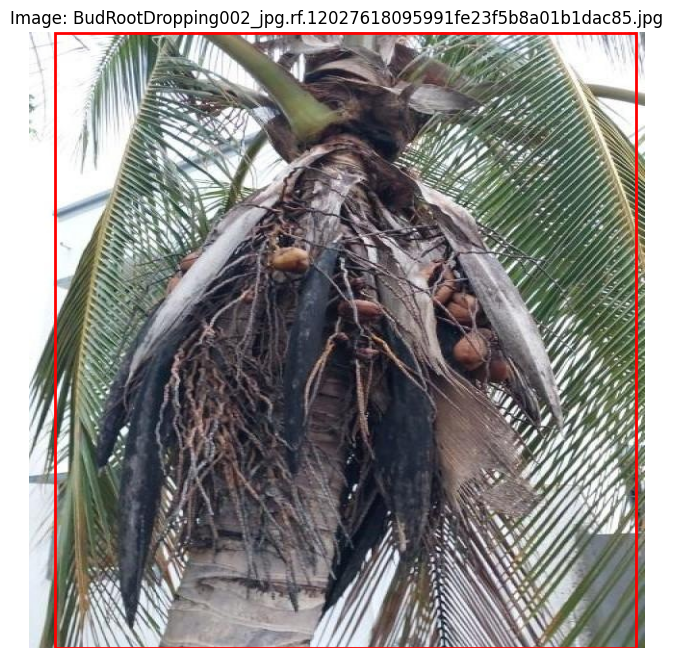

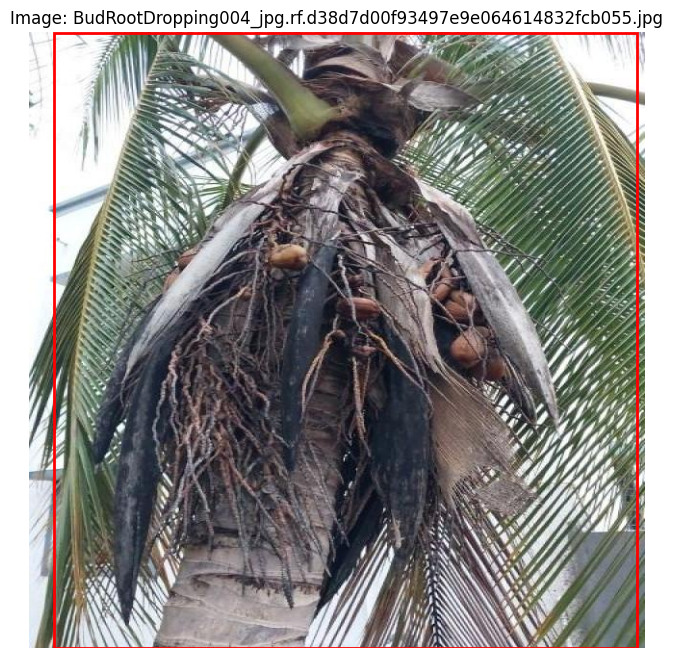

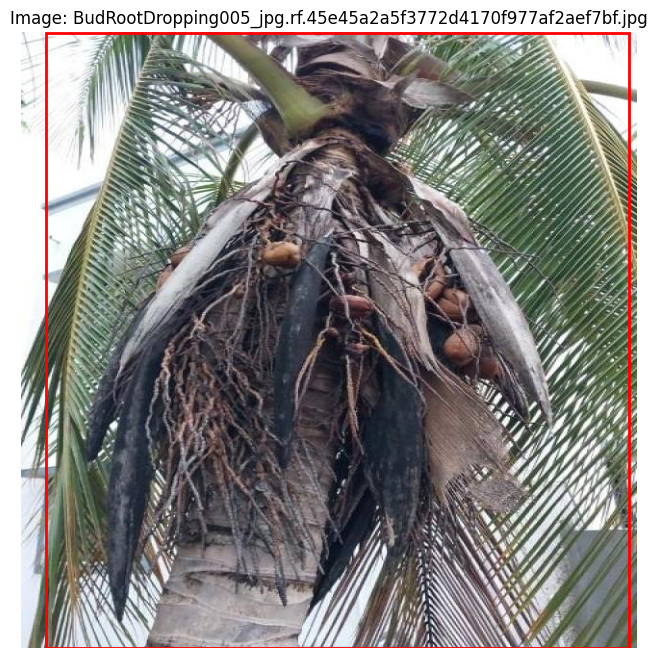

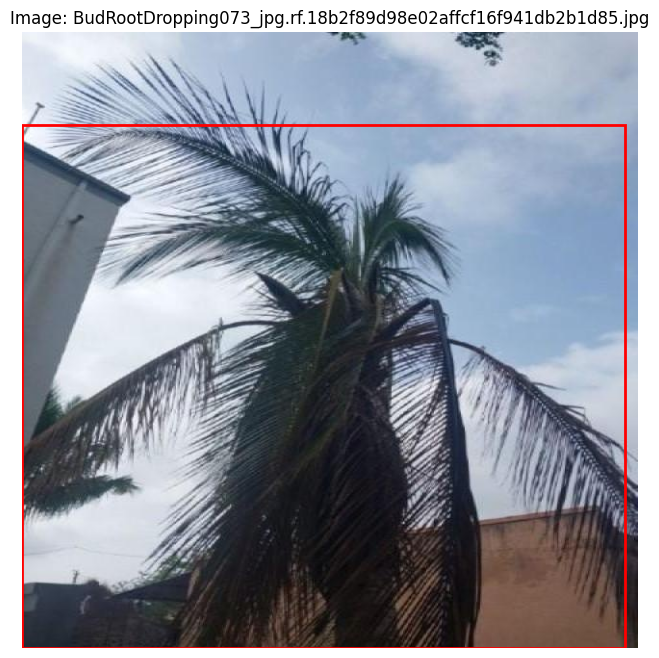

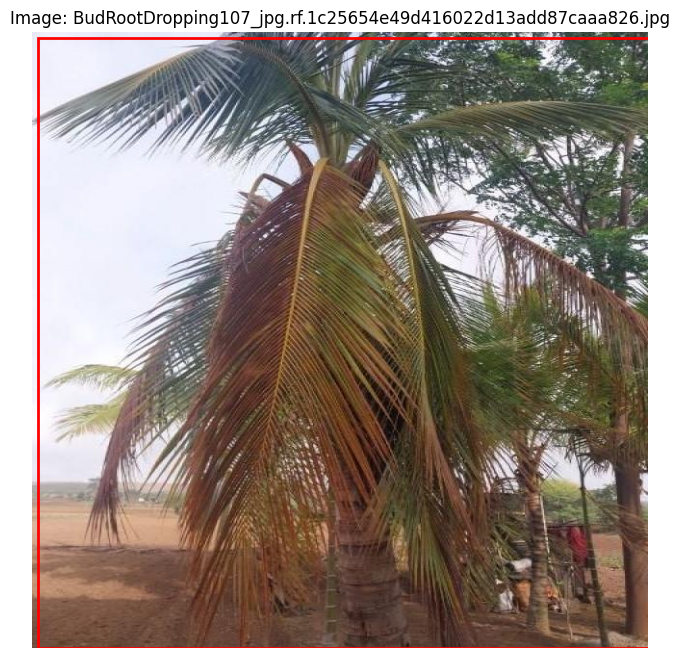

In [ ]:
import os
import cv2
import json
import matplotlib.pyplot as plt

# Paths
dataset_path = "/content/drive/MyDrive/CoconutDisease_Detected4_COCO/test/images"
annotation_file = os.path.join(dataset_path, "_annotations.coco.json")

# Load annotations
with open(annotation_file) as f:
    coco_data = json.load(f)

# Load a few images and their annotations
for img_info in coco_data["images"][:5]:
    img_path = os.path.join(dataset_path, img_info["file_name"])
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")

    # Draw bounding boxes
    for ann in coco_data["annotations"]:
        if ann["image_id"] == img_info["id"]:
            x, y, w, h = ann["bbox"]
            plt.gca().add_patch(
                plt.Rectangle((x, y), w, h, edgecolor="red", linewidth=2, fill=False)
            )

    plt.title(f"Image: {img_info['file_name']}")
    plt.show()


In [ ]:
import os
import cv2
import json
import matplotlib.pyplot as plt

# Paths
dataset_path = "/content/drive/MyDrive/CoconutDisease_Detected4_COCO/test/images"
annotation_file = os.path.join(dataset_path, "_annotations.coco.json")

# Load annotations
with open(annotation_file) as f:
    coco_data = json.load(f)

# Find the category ID for "bud rot"
category_id = None
for category in coco_data["categories"]:
    if category["name"] == "bud rot":
        category_id = category["id"]
        break

# Display images with "bud rot" detections
bud_rot_count = 0
for img_info in coco_data["images"]:
    img_path = os.path.join(dataset_path, img_info["file_name"])
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Check annotations for "bud rot"
    show_image = False
    for ann in coco_data["annotations"]:
        if ann["image_id"] == img_info["id"] and ann["category_id"] == category_id:
            x, y, w, h = ann["bbox"]
            plt.figure(figsize=(8, 8))
            plt.imshow(image)
            plt.axis("off")
            plt.gca().add_patch(
                plt.Rectangle((x, y), w, h, edgecolor="red", linewidth=2, fill=False)
            )
            plt.title(f"Bud Rot Detected: {img_info['file_name']}")
            plt.show()
            bud_rot_count += 1
            break

# If no images of "bud rot" found
if bud_rot_count == 0:
    print("No 'bud rot' images found in the dataset.")


[
    {
        "id": 0,
        "image_id": 0,
        "category_id": 0,
        "bbox": [
            26.471776962280273,
            0.810839831829071,
            604.3954105377197,
            638.4721801877022
        ],
        "area": 385889.65546145925,
        "score": 0.903444230556488,
        "iscrowd": 0
    },
    {
        "id": 1,
        "image_id": 1,
        "category_id": 0,
        "bbox": [
            25.733692169189453,
            0.957958996295929,
            606.1015739440918,
            638.0723144412041
        ],
        "area": 386736.63407296326,
        "score": 0.9130390882492065,
        "iscrowd": 0
    },
    {
        "id": 2,
        "image_id": 2,
        "category_id": 0,
        "bbox": [
            25.341211318969727,
            0.65576171875,
            606.0597896575928,
            638.5316772460938
        ],
        "area": 386988.3740014775,
        "score": 0.9030946493148804,
        "iscrowd": 0
    },
    {
        "id": 3,
   

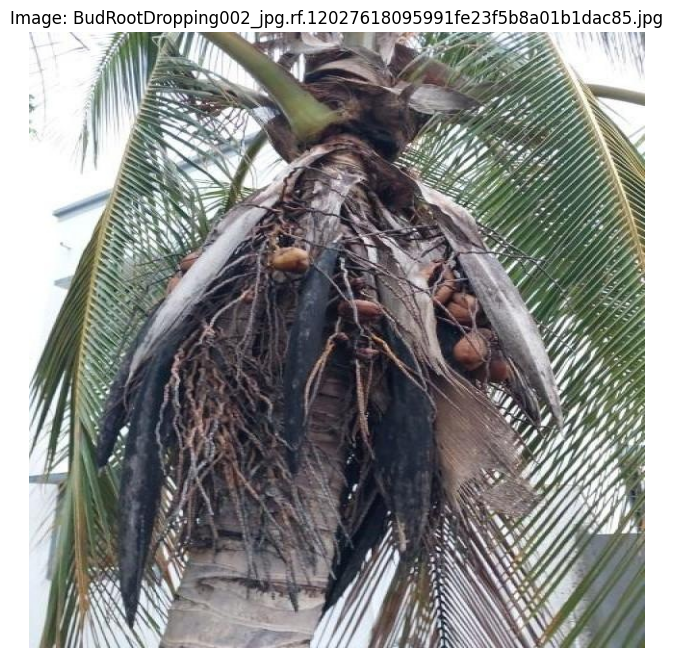

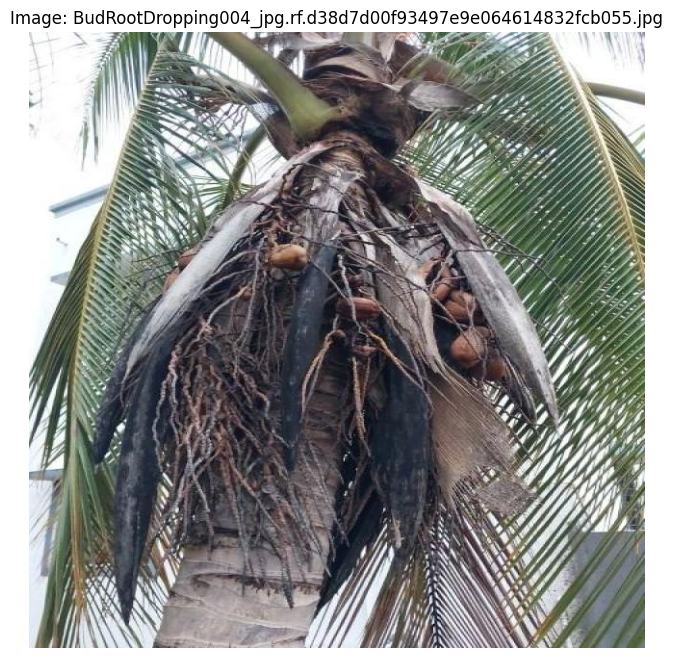

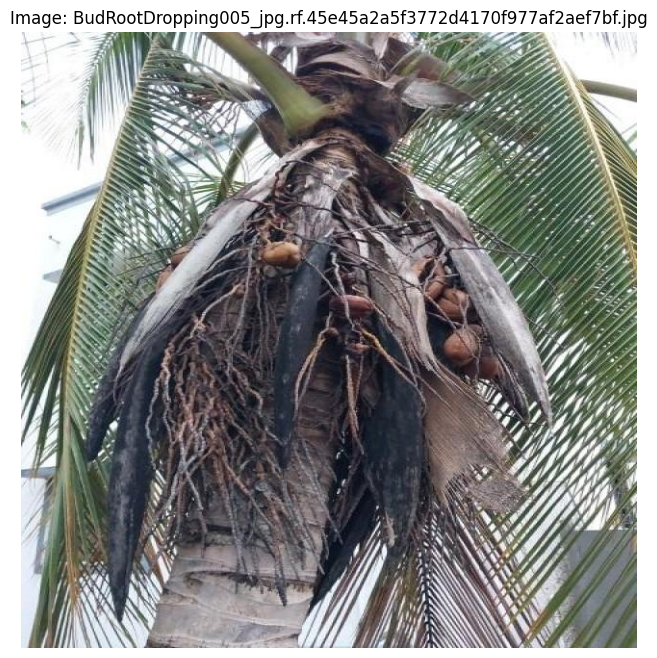

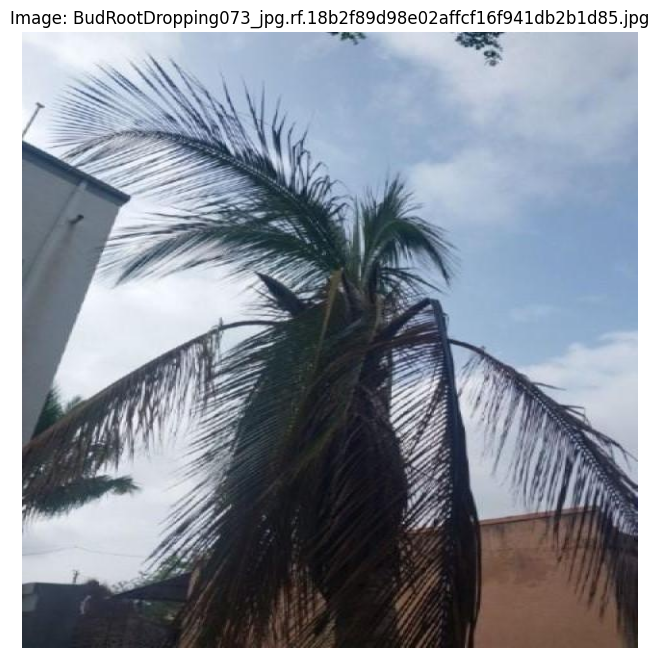

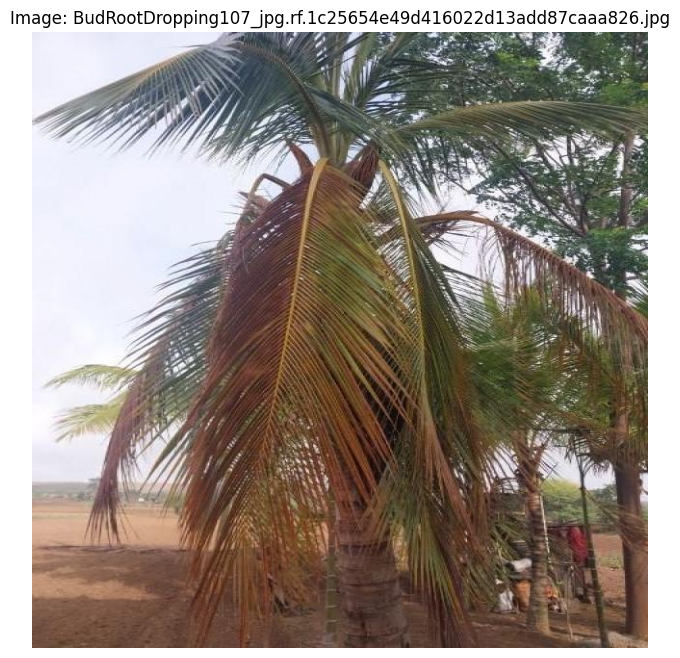

✅ Displayed first 5 images with masks!


In [ ]:
import matplotlib.pyplot as plt
import cv2
import json
import os
import numpy as np

# Define paths
split = "test"
image_folder = f"/content/drive/MyDrive/CoconutDisease_Detected4_COCO/{split}/images"
coco_path = os.path.join(image_folder, "_annotations.coco.json")

# Load the COCO annotations
with open(coco_path, "r") as file:
    coco_data = json.load(file)

# Print the first 5 annotations to inspect
print(json.dumps(coco_data["annotations"][:5], indent=4))

# Load and display the first 5 images with masks
for i, img_info in enumerate(coco_data["images"][:5]):
    img_path = os.path.join(image_folder, img_info["file_name"])
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Get annotations for this image
    annotations = [ann for ann in coco_data["annotations"] if ann["image_id"] == img_info["id"]]

    # Draw the segmentation mask (converted from bbox if needed)
    for ann in annotations:
        if "segmentation" in ann:
            segmentation = np.array(ann["segmentation"][0]).reshape(-1, 2)
            cv2.polylines(image, [segmentation.astype(np.int32)], isClosed=True, color=(0, 255, 0), thickness=2)

    # Show the image with mask overlay
    plt.figure(figsize=(8, 8))
    plt.imshow(image)
    plt.axis("off")
    plt.title(f"Image: {img_info['file_name']}")
    plt.show()

print("✅ Displayed first 5 images with masks!")


In [ ]:
import json
import os

# Define paths
for split in ["train", "valid", "test"]:
    coco_path = f"/content/drive/MyDrive/CoconutDisease_Detected4_COCO/{split}/images/_annotations.coco.json"

    # Load the original COCO annotations
    with open(coco_path, "r") as file:
        coco_data = json.load(file)

    # Convert bbox to polygon masks (rectangular approximation)
    for annotation in coco_data["annotations"]:
        x, y, width, height = annotation["bbox"]
        annotation["segmentation"] = [[
            x, y,
            x + width, y,
            x + width, y + height,
            x, y + height
        ]]

    # Save the updated COCO JSON with masks
    with open(coco_path, "w") as file:
        json.dump(coco_data, file, indent=4)

print("✅ Bounding boxes successfully converted to segmentation masks!")


✅ Bounding boxes successfully converted to segmentation masks!


In [ ]:
import os
import json
import cv2
import torch
import numpy as np
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.structures import BoxMode
from detectron2.utils.visualizer import Visualizer
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

# Define paths
source_path = "/content/drive/MyDrive/CoconutDisease_Detected4_COCO"
output_path = "/content/drive/MyDrive/CoconutDisease_Segmentation_Results1"
os.makedirs(output_path, exist_ok=True)

# Convert bbox to segmentation masks
for split in ['train', 'valid', 'test']:
    annotation_file = os.path.join(source_path, split, 'images', '_annotations.coco.json')
    with open(annotation_file, 'r') as f:
        coco_data = json.load(f)

    for annotation in coco_data['annotations']:
        x, y, w, h = annotation['bbox']
        segmentation = [
            [x, y, x + w, y, x + w, y + h, x, y + h]
        ]
        annotation['segmentation'] = segmentation

    with open(annotation_file, 'w') as f:
        json.dump(coco_data, f, indent=4)

print("✅ Bounding boxes converted to segmentation masks!")

# Load dataset into Detectron2 format
def load_coconut_dataset(split):
    json_path = os.path.join(source_path, split, 'images', '_annotations.coco.json')
    with open(json_path) as f:
        coco_data = json.load(f)
    dataset_dicts = []
    for img_data in coco_data["images"]:
        record = {
            "file_name": os.path.join(source_path, split, 'images', img_data["file_name"]),
            "image_id": img_data["id"],
            "height": img_data["height"],
            "width": img_data["width"],
            "annotations": []
        }
        for ann in coco_data["annotations"]:
            if ann["image_id"] == img_data["id"]:
                record["annotations"].append({
                    "bbox": ann["bbox"],
                    "bbox_mode": BoxMode.XYWH_ABS,
                    "segmentation": ann["segmentation"],
                    "category_id": ann["category_id"]
                })
        dataset_dicts.append(record)
    return dataset_dicts

# Register datasets
for split in ["train", "valid", "test"]:
    DatasetCatalog.register("coconut_segmentation_" + split, lambda split=split: load_coconut_dataset(split))
    MetadataCatalog.get("coconut_segmentation_" + split).set(thing_classes=["bud root drooping", "bud rot", "gray leaf", "leaf rot", "whitefly","ccl"])

# Configure Mask R-CNN
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("coconut_segmentation_train",)
cfg.DATASETS.TEST = ("coconut_segmentation_valid",)
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5
cfg.OUTPUT_DIR = output_path

# Train the model
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

# Load best weights
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
predictor = DefaultPredictor(cfg)

# Evaluate the model
evaluator = COCOEvaluator("coconut_segmentation_test", cfg, False, output_dir=output_path)
val_loader = build_detection_test_loader(cfg, "coconut_segmentation_test")
print("Evaluating model...")
results = inference_on_dataset(predictor.model, val_loader, evaluator)
print("✅ Evaluation Results:", results)

# Visualize and save test results
test_metadata = MetadataCatalog.get("coconut_segmentation_test")
test_dataset = load_coconut_dataset("test")
for d in test_dataset[:5]:
    img = cv2.imread(d["file_name"])
    outputs = predictor(img)
    v = Visualizer(img[:, :, ::-1], metadata=test_metadata, scale=0.8)
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2.imwrite(os.path.join(output_path, f"result_{d['image_id']}.jpg"), v.get_image()[:, :, ::-1])

print("✅ Mask R-CNN training, testing, and segmentation complete! Results saved to Google Drive.")


✅ Bounding boxes converted to segmentation masks!
[03/15 17:40:41 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_fe

model_final_f10217.pkl: 178MB [00:00, 183MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[03/15 17:40:44 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.11/dist-packages/torch/functional.py:539: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:3637.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[03/15 17:40:57 d2.utils.events]:  eta: 0:25:47  iter: 19  total_loss: 2.743  loss_cls: 1.864  loss_box_reg: 0.138  loss_mask: 0.6934  loss_rpn_cls: 0.03684  loss_rpn_loc: 0.0112    time: 0.4970  last_time: 0.5535  data_time: 0.1770  last_data_time: 0.2290   lr: 4.9953e-06  max_mem: 1766M
[03/15 17:41:12 d2.utils.events]:  eta: 0:24:34  iter: 39  total_loss: 2.517  loss_cls: 1.617  loss_box_reg: 0.1245  loss_mask: 0.6906  loss_rpn_cls: 0.06847  loss_rpn_loc: 0.0153    time: 0.4990  last_time: 0.5261  data_time: 0.1542  last_data_time: 0.2194   lr: 9.9902e-06  max_mem: 1767M
[03/15 17:41:23 d2.utils.events]:  eta: 0:25:52  iter: 59  total_loss: 2.056  loss_cls: 1.19  loss_box_reg: 0.08627  loss_mask: 0.6879  loss_rpn_cls: 0.04119  loss_rpn_loc: 0.01217    time: 0.5175  last_time: 0.4312  data_time: 0.2182  last_data_time: 0.1537   lr: 1.4985e-05  max_mem: 1767M
[03/15 17:41:32 d2.utils.events]:  eta: 0:25:38  iter: 79  total_loss: 1.615  loss_cls: 0.7432  loss_box_reg: 0.1122  loss_mask

In [ ]:
import os
import cv2
import torch
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# Paths
source_path = "/content/drive/MyDrive/CoconutDisease_Detected4_COCO"
model_path = "/content/drive/MyDrive/CoconutDisease_Segmentation_Results1/model_final.pth"
output_path = "/content/drive/MyDrive/CoconutDisease_Segmented_Output"
os.makedirs(output_path, exist_ok=True)

# Load the trained Mask R-CNN model
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 5
cfg.MODEL.WEIGHTS = model_path
cfg.MODEL.DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

predictor = DefaultPredictor(cfg)
metadata = MetadataCatalog.get("coconut_segmentation_test")

# Apply segmentation to all images
for split in ["train", "valid", "test"]:
    split_input_path = os.path.join(source_path, split, 'images')
    split_output_path = os.path.join(output_path, split)
    os.makedirs(split_output_path, exist_ok=True)

    # Process each image
    for image_file in os.listdir(split_input_path):
        if image_file.endswith(".jpg") or image_file.endswith(".png"):
            image_path = os.path.join(split_input_path, image_file)
            img = cv2.imread(image_path)

            # Perform segmentation
            outputs = predictor(img)
            v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.8)
            v = v.draw_instance_predictions(outputs["instances"].to("cpu"))

            # Save the segmented image
            output_file_path = os.path.join(split_output_path, f"segmented_{image_file}")
            cv2.imwrite(output_file_path, v.get_image()[:, :, ::-1])

print("✅ All images segmented and saved to Google Drive!")


[03/15 18:19:59 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/drive/MyDrive/CoconutDisease_Segmentation_Results1/model_final.pth ...
✅ All images segmented and saved to Google Drive!
